In [28]:
#1. Data Harvesting and Processing
#Each file with the extentions ".rna_seq.augmented_star_gene_counts.tsv" had multiple entries in them so, out of these only File name, gene_id, gene_name, gene_type 
# and fpkm_uq_unstranded (gene expression profile) values were chosen. 

In [71]:
#Required Libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
import joblib
import streamlit as st
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import umap
import os


In [ ]:
#1. TO CREATE A CSV FILE WITH SAMPLEID AS FILE_NAME PRESENT IN THE BLADDER FOLDER
def gene_harvest(base_download_dir, file_pattern=".tsv", value_column='fpkm_uq_unstranded'):
    all_sample_gene_data = []
    print(f"Loading Data from: {base_download_dir}")

    #Required Columns (Verification step)
    required_columns = ['gene_id', 'gene_name', 'gene_type', value_column]

    if not os.path.isdir(base_download_dir):
        print(f"Download directory '{base_download_dir}' not found.")
        return None

#Code to iterate through each individual Folder in Bladder folder and then harvest those ending with .rna_seq.augmented_star_gene_counts.tsv
    for sample_folder_name in os.listdir(base_download_dir):
        sample_folder_path = os.path.join(base_download_dir, sample_folder_name)

        if os.path.isdir(sample_folder_path):
            print(f"Current Folderr: {sample_folder_name}") 
            gene_expression_file_found = False

            for file_name in os.listdir(sample_folder_path):
                if file_name.endswith(file_pattern):
                    file_path = os.path.join(sample_folder_path, file_name)
                    try:
                        df = pd.read_csv(file_path, sep='\t', skiprows=1, header=0)
                        if not all(col in df.columns for col in required_columns):
                            missing_cols = [col for col in required_columns if col not in df.columns]
                            raise ValueError(f"Missing columns in file {file_name}: {missing_cols}")
                        df = df[~df['gene_id'].astype(str).str.startswith('N_')]
                        df_subset = df[['gene_id', 'gene_name', 'gene_type', value_column]].copy()
                        sample_id = file_name.replace(file_pattern, '')
                        df_subset['Sample_ID'] = sample_id
                        all_sample_gene_data.append(df_subset)
                        gene_expression_file_found = True
                        print(f"Loaded {file_name} and extracted {sample_id}")
                        break
                    except Exception as e:
                        print(f"Error")
            if not gene_expression_file_found:
                print(f"No gene expression file matching")

    if not all_sample_gene_data:
        print("No gene expression data was loaded")
        return None

    # Concatenate all individual sample DataFrames into one large DataFrame
    final_df_long = pd.concat(all_sample_gene_data, ignore_index=True)

    # Reordered columns as: Sample_ID (our Index Column), gene_name, gene_type, gene_id, fpkm_uq_unstranded
    final_df_long = final_df_long[['Sample_ID', 'gene_name', 'gene_type', 'gene_id', value_column]]
    print("Compilation Completed")
    print(f"Final DataFrame shape: {final_df_long.shape}")
    return final_df_long
#Dedicated a variable holding the path of our main Data harvesting folder
DOWNLOAD_BASE_DIR = 'C:/Users/sspat/Desktop/Bladder'

#Dedicated another variable to remove the suffix and the leftover string becomes the SampleID
FILE_IDENTIFIER = '.rna_seq.augmented_star_gene_counts.tsv'
VALUE_COLUMN_TO_USE = 'fpkm_uq_unstranded' #This is the gene Expression value

#Loading the gene expression data in long format
gene_expression_long_df = gene_harvest(
    base_download_dir=DOWNLOAD_BASE_DIR,
    file_pattern=FILE_IDENTIFIER,
    value_column=VALUE_COLUMN_TO_USE
)
if gene_expression_long_df is not None:
    print("\nFirst 10 rows of the loaded data in long format:")
    print(gene_expression_long_df.head(10))
    #Saving the combined file in csv format
    desktop_path = 'C:/Users/sspat/Desktop'
    output_csv_file_long = os.path.join(desktop_path, 'TCGA_BLCA.csv')
   # Save the DataFrame to CSV.
    gene_expression_long_df.to_csv(output_csv_file_long, index=False)
    print(f"\nCombined gene expression data in long format successfully saved to: {output_csv_file_long}")
else:
    print("\nData loading failed. No CSV file will be generated.")

Loading Data from: C:/Users/sspat/Desktop/Bladder
Current Folderr: 0180b8ef-dbca-4edd-bce1-3f793f354f13
Loaded 3d2e487a-fa99-4aad-86c5-aca05f221bbe.rna_seq.augmented_star_gene_counts.tsv and extracted 3d2e487a-fa99-4aad-86c5-aca05f221bbe
Current Folderr: 01d381c7-6398-47cb-925c-078cd538852f
Loaded 8fc50ee0-c87c-4c06-bc03-5309941b617f.rna_seq.augmented_star_gene_counts.tsv and extracted 8fc50ee0-c87c-4c06-bc03-5309941b617f
Current Folderr: 0240ae8f-9354-4123-b791-5333317ae9f0
Loaded 42766493-7dff-4c09-821a-bd5952d95adc.rna_seq.augmented_star_gene_counts.tsv and extracted 42766493-7dff-4c09-821a-bd5952d95adc
Current Folderr: 047dc5b6-c15e-4dad-b753-de55ca6e171c
Loaded f437e625-9c4f-4da9-bef9-a490ae120908.rna_seq.augmented_star_gene_counts.tsv and extracted f437e625-9c4f-4da9-bef9-a490ae120908
Current Folderr: 048da4d7-cab0-49c5-8bc9-78b1bf0b365b
Loaded cbc6b1c2-5536-45ba-9307-7358ada07264.rna_seq.augmented_star_gene_counts.tsv and extracted cbc6b1c2-5536-45ba-9307-7358ada07264
Current Fo

In [ ]:
#The compiled file is too large to open on via the Excel so, Pandas has been used to print out the first 10 rows in order to understand that the CSV file has been made according 
#to the mentioned format

a = pd.read_csv("C:/Users/sspat/Desktop/TCGA_BLCA.csv")
a.head(10)

,Sample_ID,gene_name,gene_type,gene_id,fpkm_uq_unstranded
0,3d2e487a-fa99-4aad-86c5-aca05f221bbe,TSPAN6,protein_coding,ENSG00000000003.15,6.6395
1,3d2e487a-fa99-4aad-86c5-aca05f221bbe,TNMD,protein_coding,ENSG00000000005.6,0.0000
2,3d2e487a-fa99-4aad-86c5-aca05f221bbe,DPM1,protein_coding,ENSG00000000419.13,48.4643
3,3d2e487a-fa99-4aad-86c5-aca05f221bbe,SCYL3,protein_coding,ENSG00000000457.14,3.6469
4,3d2e487a-fa99-4aad-86c5-aca05f221bbe,C1orf112,protein_coding,ENSG00000000460.17,14.3349
5,3d2e487a-fa99-4aad-86c5-aca05f221bbe,FGR,protein_coding,ENSG00000000938.13,0.9694
6,3d2e487a-fa99-4aad-86c5-aca05f221bbe,CFH,protein_coding,ENSG00000000971.16,0.7297
7,3d2e487a-fa99-4aad-86c5-aca05f221bbe,FUCA2,protein_coding,ENSG00000001036.14,15.6397
8,3d2e487a-fa99-4aad-86c5-aca05f221bbe,GCLC,protein_coding,ENSG00000001084.13,5.1043
9,3d2e487a-fa99-4aad-86c5-aca05f221bbe,NFYA,protein_coding,ENSG00000001167.14,17.0313


In [22]:
#There are thousands of genes for individual sample so, the code below helps to search a particular Sample_ID
COMBINED_CSV_FILE_PATH = 'C:/Users/sspat/Desktop/TCGA_BLCA.csv'
# Sample_ID search string
TARGET_SAMPLE_ID = 'a3986c49-fabd-4b08-9d77-3e25576fce4e' #Targeted Sample to search 
try:
    df = pd.read_csv(COMBINED_CSV_FILE_PATH)
    print(f"Successfully Loaded'{COMBINED_CSV_FILE_PATH}'.")

    if 'Sample_ID' not in df.columns:
        print(f"*'Sample_ID'* column not found")
    else:
        found = df[df['Sample_ID'] == TARGET_SAMPLE_ID]

        if not found.empty:
            print(f"\nData found for Sample_ID: '{TARGET_SAMPLE_ID}'")
            print(found.to_string())
            print(f"\nTotal rows found: {len(found)}")
        else:
            print(f"\nNo data found for Sample_ID: '{TARGET_SAMPLE_ID}'.")

except FileNotFoundError:
    print(f"File not found")
#The output will give all the entries related only to the specific sample. This helps to isolate a particular data point from an extremely complex data

Successfully Loaded'C:/Users/sspat/Desktop/TCGA_BLCA.csv'.

Data found for Sample_ID: 'a3986c49-fabd-4b08-9d77-3e25576fce4e'
                                     Sample_ID                  gene_name                           gene_type                   gene_id  fpkm_uq_unstranded
14437080  a3986c49-fabd-4b08-9d77-3e25576fce4e                     TSPAN6                      protein_coding        ENSG00000000003.15             37.9454
14437081  a3986c49-fabd-4b08-9d77-3e25576fce4e                       TNMD                      protein_coding         ENSG00000000005.6              0.0444
14437082  a3986c49-fabd-4b08-9d77-3e25576fce4e                       DPM1                      protein_coding        ENSG00000000419.13             24.8949
14437083  a3986c49-fabd-4b08-9d77-3e25576fce4e                      SCYL3                      protein_coding        ENSG00000000457.14              2.9787
14437084  a3986c49-fabd-4b08-9d77-3e25576fce4e                   C1orf112                      

In [ ]:
#1. A thorough search was conducted to find out labels for bladder cancer which is when a research paper published by TCGA itself consisted of a table with exact labels from UNC, MDA
    #and Lund University for individual Sample. As MDA is more established in the Cancer sector, the labels given by them were selected.

#2. A Clinical.tsv file containing Unique_IDs for each individual Sample exhibiting gene expression profile was downloaded from the TCGA's website (for bladder cancer) and converted into a CSV format.

#3. A metadata file was downloaded from TCGA's website (for bladder cancer) which contained file_names of individual samples

#4. . Appropriate mapping ensured the formation of a well-processed table, the following was the process which was followed:
          #a. Each Clinical.csv files Sample names were matched with the Sample names present in the research paper based table and if matched then their Unique_ID was filled as a new column
          #b. Based on these Unique_IDs the file_names for each individual sample was filled in a new column if matched
          #c. These file_names were later used to match with the TCGA-BLCA.csv file (containing gene expression profiles) and if matched then the appropriate values for the sample were filled.

In [ ]:
#2a. This code fills a new column "ID" in our label containing Table

#Output File name
output_file_name = 'Table with Unique ID.csv'
desktop_path="C:/Users/sspat/Desktop" #Save Path
output_file_name = os.path.join(desktop_path, 'Table with Unique ID.csv')

#Loading Downloaded Subtype containing Table
df_arranged_table = pd.read_excel("C:/Users/sspat/Desktop/Arranged Table.xlsx")

#Clinical.csv File (this file contains unique ID for each sample)
df_clinical = pd.read_csv("C:/Users/sspat/Desktop/clinical.csv", header=None)

#Renaming Columns for clarity
df_clinical = df_clinical.rename(columns={
    9: 'clinical_match_id',  #This matches the 9th column of Clinical.csv file with 1st Column of the Arranged Table file- This ensures correct Unique IDs are extracted for respective samples
    1: 'clinical_value_to_extract' #This extracts the values present in the 2nd column of Clinical.csv which is the Unique ID and fills in the new Table
})

#Processing Duplicates
df_clinical_subset = df_clinical[['clinical_match_id', 'clinical_value_to_extract']].drop_duplicates(subset=['clinical_match_id'], keep='first')

#Left Merge to add the Unique ID column
df_combined = pd.merge(
    df_arranged_table,
    df_clinical_subset,
    left_on='SampleID',              # Column from Arranged Table
    right_on='clinical_match_id',    # Column from Clinical Data
    how='left'                       # Keeps all rows from Arranged Table (which is the subtype containing table)
)

#Renaming the Column to Unique_ID
df_combined = df_combined.rename(columns={'clinical_value_to_extract': 'Unique_ID'})

#Matching column removed to avoid data repetition
df_combined = df_combined.drop(columns=['clinical_match_id'])

#Saved the file in CSV format
df_combined.to_csv(output_file_name, index=False)
print(f"Combined data saved to '{output_file_name}'")

Combined data saved to 'C:/Users/sspat/Desktop\Table with Unique ID.csv'


In [ ]:
#2b. Based on these Unique IDs, file names would be filled 
#File Path Variables
output_file_name_base = 'Table with Filenames.csv'
desktop_path = 'C:/Users/sspat/Desktop' 
output_file_name = os.path.join(desktop_path, output_file_name_base)

try:
    #Metadata File
    df_metadata = pd.read_csv("C:/Users/sspat/Desktop/metadata.cart.2025-06-07.csv")
    print("Successfully Loaded")
    metadata_match_col = 'associated_entities/0/case_id'
    metadata_harvest_col = 'file_name' #Verifies if column present or not
    if metadata_match_col not in df_metadata.columns or metadata_harvest_col not in df_metadata.columns:
        raise ValueError(f"\nColumns '{metadata_match_col}' or '{metadata_harvest_col}' not found")

    #For Arranged File (This contains the labels and now the Unique IDs)
    df_arranged = pd.read_csv("C:/Users/sspat/Desktop/Table with Unique ID.csv")
    print(f"Successfully loaded '{df_arranged}")
    arranged_match_col = 'Unique_ID' #Verifies if column present or not
    if arranged_match_col not in df_arranged.columns:
        raise ValueError(f"Required column '{arranged_match_col}' not found")

    #Selecting Necessary Columns
    df_metadata_subset = df_metadata[[metadata_match_col, metadata_harvest_col]].copy()

    #Removal of Duplicates
    if df_metadata_subset[metadata_match_col].duplicated().any():
        print("/nWarning: Duplicate values found")
        df_metadata_subset = df_metadata_subset.drop_duplicates(subset=[metadata_match_col], keep='first')

    #Left Merge
    df_combined_new = pd.merge(
        df_arranged,
        df_metadata_subset,
        left_on=arranged_match_col,
        right_on=metadata_match_col,
        how='left'
    )

    #Removal of Matching column
    df_combined_new = df_combined_new.drop(columns=[metadata_match_col])

    #Renaming the Newly Created accurately mapped column to File_name
    df_combined_new = df_combined_new.rename(columns={metadata_harvest_col: 'File_name'})

    df_combined_new.to_csv(output_file_name, index=False)
    print(f"\nAttempted to save new combined document to '{output_file_name}'")
except FileNotFoundError as e:
    print("File not Found")

Successfully Loaded
Successfully loaded '         SampleID  Unnamed: 1  Unnamed: 2      Histology  TCGAclass  \
0    TCGA-DK-A6AV         NaN         NaN            NaN        NaN   
1    TCGA-DK-A3WX         NaN         NaN  Non-papillary        NaN   
2    TCGA-FD-A3SQ         NaN         NaN  Non-papillary        NaN   
3    TCGA-DK-A1AC         NaN         NaN  Non-papillary        NaN   
4    TCGA-FD-A43N         NaN         NaN            NaN        NaN   
..            ...         ...         ...            ...        ...   
229  TCGA-UY-A78N         NaN         NaN            NaN        NaN   
230  TCGA-DK-A3IS         NaN         NaN      Papillary        NaN   
231  TCGA-FD-A6TF         NaN         NaN            NaN        NaN   
232  TCGA-BT-A20P         NaN         NaN  Non-papillary        NaN   
233  TCGA-E5-A4U1         NaN         NaN            NaN        NaN   

     Unnamed: 5  Two_group  Three_group  Unnamed: 8  Six_group  ...  \
0           NaN          2         

In [ ]:
#The code below just provides some information on the Newly created file
y = pd.read_csv("C:/Users/sspat/Desktop/Table with Filenames.csv")
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234 entries, 0 to 233
Data columns (total 42 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   SampleID          234 non-null    object 
 1   Unnamed: 1        0 non-null      float64
 2   Unnamed: 2        0 non-null      float64
 3   Histology         125 non-null    object 
 4   TCGAclass         0 non-null      float64
 5   Unnamed: 5        126 non-null    float64
 6   Two_group         234 non-null    int64  
 7   Three_group       234 non-null    int64  
 8   Unnamed: 8        0 non-null      float64
 9   Six_group         234 non-null    int64  
 10  UNC               234 non-null    object 
 11  MDA               234 non-null    object 
 12  Lund              234 non-null    object 
 13  FGFR3m            234 non-null    int64  
 14  FGFR3cna          234 non-null    int64  
 15  PIK3CAm           234 non-null    int64  
 16  RASm              234 non-null    int64  
 1

In [ ]:
#2c. Creates a file with gene expression profiles based on mapping done on the basis of file_names (note the "SampleID" column and the "File_names" column 
#                                                                                                        of TCGA_BLCA.csv and "Table with Filenames.csv" respectively 
#                                                                                                        have identical entries)

#TCGA_BLCA.csv
tcga_blca_file_path = 'C:/Users/sspat/Desktop/TCGA_BLCA.csv' 

#Table with Filenames
Filename_table_path = 'C:/Users/sspat/Desktop/Table with Filenames.csv'

#Newly Processed File name (containes gene expression profile as well)
output_file_name = 'Combined.csv'
desktop_path = 'C:/Users/sspat/Desktop'
output_full_path = os.path.join(desktop_path, output_file_name)
# Define the suffix to remove from the 'File_name' column in Table with Filenames
FILENAME_SUFFIX_TO_REMOVE = '.rna_seq.augmented_star_gene_counts.tsv'
encoding_to_use = 'utf-8' 

try:
    #Load Files
    df_tcga_blca = pd.read_csv(tcga_blca_file_path, encoding=encoding_to_use)
    print(f"Successfully loaded '{tcga_blca_file_path}'. Shape: {df_tcga_blca.shape}")
    df_arranged = pd.read_csv(Filename_table_path)
    print(f"Successfully loaded '{Filename_table_path}'. Shape: {df_arranged.shape}")

    #Verifying
    if 'Sample_ID' not in df_tcga_blca.columns:
        raise ValueError(f"'Sample_ID' column not found in '{tcga_blca_file_path}'")
    if 'File_name' not in df_arranged.columns:
        raise ValueError(f"'File_name' column not found in '{Filename_table_path}'")

    #Processing 
    df_arranged['Match_ID_Arranged'] = df_arranged['File_name'].astype(str).str.replace(
        FILENAME_SUFFIX_TO_REMOVE, '', regex=False
    ).str.strip()

    #Clean
    df_tcga_blca['Sample_ID_Cleaned'] = df_tcga_blca['Sample_ID'].astype(str).str.strip()
    #Inner Merge
    df_combined = pd.merge(
        df_tcga_blca,
        df_arranged,
        left_on='Sample_ID_Cleaned', # Column from TCGA-BLCA
        right_on='Match_ID_Arranged', # Processed column from Table with Filenames
        how='inner'                   # Keeps only matching rows
    )

    # Clean up temporary columns used for merging
    df_combined.drop(columns=['Sample_ID_Cleaned', 'Match_ID_Arranged'], inplace=True, errors='ignore')
    print("\nMerge completed")
    print("\nFirst 5 rows of the newly combined DataFrame:")
    print(df_combined.head().to_string())
    df_combined.to_csv(output_full_path, index=False)
    print(f"\nCombined data successfully saved to: '{output_full_path}'")

except FileNotFoundError as e:
    print("File not Found")

Successfully loaded 'C:/Users/sspat/Desktop/TCGA_BLCA.csv'. Shape: (25841160, 5)
Successfully loaded 'C:/Users/sspat/Desktop/Table with Filenames.csv'. Shape: (234, 42)

Merge completed

First 5 rows of the newly combined DataFrame:
                              Sample_ID gene_name       gene_type             gene_id  fpkm_uq_unstranded      SampleID  Unnamed: 1  Unnamed: 2      Histology  TCGAclass  Unnamed: 5  Two_group  Three_group  Unnamed: 8  Six_group      UNC      MDA  Lund  FGFR3m  FGFR3cna  PIK3CAm  RASm  chr9pDel  chr9qDel  CDKN2Acna  TP53m  MDM2cna  RB1m  Unnamed: 23  RB1cna  E2F3cna  cor.UNC.Basal  cor.UNC.Luminal  cor.MDA.Basal  cor.MDA.tp53like  cor.MDA.Luminal  cor.Lund.MS1a  Unnamed: 32  cor.Lund.MS1b  Unnamed: 34  cor.Lund.MS2a1  cor.Lund.MS2a2  cor.Lund.MS2b1  cor.Lund.MS2b2.1  cor.Lund.MS2b2.2                             Unique_ID                                                                    File_name
0  8fc50ee0-c87c-4c06-bc03-5309941b617f    TSPAN6  protein_co

In [ ]:
#3 There are multiple Unnamed:1,2,3... columns in the data. The code below removes it

#Variable to store the Path of the Combined.csv
input_file = 'C:/Users/sspat/Desktop/Combined.csv' 

#Variable to store the Path of the cleaned file
output_file_name = 'Combined_Cleaned.csv'
desktop_path = 'C:/Users/sspat/Desktop' 
output_full_path = os.path.join(desktop_path, output_file_name)
encoding_to_use = 'utf-8' 
FILENAME_SUFFIX_TO_REMOVE = '.rna_seq.augmented_star_gene_counts.tsv'

try:
    
    df_combined = pd.read_csv(input_file, encoding=encoding_to_use)
    print(f"Successfully loaded '{input_file}'. Original shape: {df_combined.shape}")

    #Unnamed columns removed
    columns_to_drop = [col for col in df_combined.columns if col.startswith('Unnamed:')]
    arranged_ids_cleaned = df_combined['File_name'].astype(str).str.replace(
        FILENAME_SUFFIX_TO_REMOVE, '', regex=False
    ).str.strip().dropna().unique()



    if columns_to_drop:
        df_cleaned = df_combined.drop(columns=columns_to_drop)
        print(f"Removed {len(columns_to_drop)} 'Unnamed:' columns: {columns_to_drop}")
        print(f"/nNew Shape:{df_cleaned.shape}")
    else:
        df_cleaned = df_combined.copy()
        print("No 'Unnamed:' columns found in the DataFrame.")

    print("\nFirst 5 rows of the cleaned DataFrame:")
    print(df_cleaned.head().to_string())
    
    df_cleaned.to_csv(output_full_path, index=False)
    print("File Saved")

except FileNotFoundError as e:
    print("File not Found")

C:\Users\sspat\AppData\Local\Temp\ipykernel_15324\132692333.py:15: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  df_combined = pd.read_csv(input_combined_file_path, encoding=encoding_to_use)


Successfully loaded 'C:/Users/sspat/Desktop/Combined.csv'. Original shape: (13891140, 47)
Removed 7 'Unnamed:' columns: ['Unnamed: 1', 'Unnamed: 2', 'Unnamed: 5', 'Unnamed: 8', 'Unnamed: 23', 'Unnamed: 32', 'Unnamed: 34']
/nNew Shape:(13891140, 40)

First 5 rows of the cleaned DataFrame:
                              Sample_ID gene_name       gene_type             gene_id  fpkm_uq_unstranded      SampleID      Histology  TCGAclass  Two_group  Three_group  Six_group      UNC      MDA  Lund  FGFR3m  FGFR3cna  PIK3CAm  RASm  chr9pDel  chr9qDel  CDKN2Acna  TP53m  MDM2cna  RB1m  RB1cna  E2F3cna  cor.UNC.Basal  cor.UNC.Luminal  cor.MDA.Basal  cor.MDA.tp53like  cor.MDA.Luminal  cor.Lund.MS1a  cor.Lund.MS1b  cor.Lund.MS2a1  cor.Lund.MS2a2  cor.Lund.MS2b1  cor.Lund.MS2b2.1  cor.Lund.MS2b2.2                             Unique_ID                                                                    File_name
0  8fc50ee0-c87c-4c06-bc03-5309941b617f    TSPAN6  protein_coding  ENSG00000000003.15       

In [43]:
#DATA PROCESSING IS DONE

In [44]:
#Applying PCA, UMAP for Dimensionality Reduction and Analysis

In [ ]:
#4 Pre-processing Data in wide-format for PCA (Principal Component Analysis)
# In Wide Format the rows become individual samples and Columns become individiual genes with their respective gene expression profiles. This file would also contain labels 
#Do note that labels defined by MDA have been selected because MDA is well-known for its accuracy in subtype identification especially for cancer

#Variable to define the path to the cleaned data file
input_file = 'C:/Users/sspat/Desktop/Combined_Cleaned.csv'

# Desired name for the output file containing wide gene expression data with subtypes
output_wide_data_file_name = 'Wide Data.csv'
desktop_path = 'C:/Users/sspat/Desktop' 
output_full_path = os.path.join(desktop_path, output_wide_data_file_name)
encoding_to_use = 'utf-8' 

#Selecting necessary data points (columns)
SUBTYPE_COLUMN = 'MDA'
GENE_EXPRESSION_VALUE_COLUMN = 'fpkm_uq_unstranded'
GENE_NAME_COLUMN = 'gene_name'
SAMPLE_ID_COLUMN = 'SampleID' #SampleID (in form of TCGA-xy-xyzj)


try:
    #Input File
    df_combined = pd.read_csv(input_file, encoding=encoding_to_use)
    print(f"Successfully loaded '{input_file}'. Original shape: {df_combined.shape}")
    print(f"Columns in loaded DataFrame: {df_combined.columns.tolist()}")

    #Column Verification
    required_columns = [SAMPLE_ID_COLUMN, GENE_NAME_COLUMN, GENE_EXPRESSION_VALUE_COLUMN, SUBTYPE_COLUMN]
    for col in required_columns:
        if col not in df_combined.columns:
            raise ValueError(f"Error: Required column '{col}' not found in the combined file.")

    #Converting the Data into a Wide format
    print(f"\nConverting the Data into a wide Format")
    df_gene_expression_wide = df_combined.pivot_table(
        index=SAMPLE_ID_COLUMN,
        columns=GENE_NAME_COLUMN,
        values=GENE_EXPRESSION_VALUE_COLUMN
    )

    print(f"Shape of pivoted gene expression data: {df_gene_expression_wide.shape}")
    print("First 5 rows and columns of pivoted data (samples as rows, genes as columns):")
    print(df_gene_expression_wide.iloc[:5, :5])
    #Aligning MDA defined subtype classification labels
    df_subtypes = df_combined[[SAMPLE_ID_COLUMN, SUBTYPE_COLUMN]].drop_duplicates().set_index(SAMPLE_ID_COLUMN)
    df_final_data = df_gene_expression_wide.merge(
        df_subtypes,
        left_index=True,
        right_index=True,
        how='inner' # Inner merge used to ensure only samples with both data types are kept
    )
    # Subtype column as Index column
    cols = [SUBTYPE_COLUMN] + [col for col in df_final_data.columns if col != SUBTYPE_COLUMN]
    df_final_data = df_final_data[cols]
    #Removing NaN data points
    print(f"\nHandling NaN values in gene expression data")
    df_final_data.fillna(0, inplace=True)
    print(f"NaNs after filling with 0: {df_final_data.isnull().sum().sum()}")

    print(f"\nFinal ML-ready DataFrame shape: {df_final_data.shape}")
    print("First 5 rows of the ML-ready DataFrame (Subtype + Gene Expression):")
    print(df_final_data.iloc[:5, :5])

    #Exporting in CSV
    df_final_data.to_csv(output_full_path, index=True) # Keep index as Sample_ID
    print(f"\nML-ready data successfully saved to: '{output_full_path}'")   
    print("This file contains samples as rows, genes as columns, and the 'MDA' subtype as the first column.")
except FileNotFoundError as e:
    print("File not Found")
except ValueError as e:
    print("Error")

C:\Users\sspat\AppData\Local\Temp\ipykernel_15324\770947748.py:23: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  df_combined = pd.read_csv(input_file, encoding=encoding_to_use)


Successfully loaded 'C:/Users/sspat/Desktop/Combined_Cleaned.csv'. Original shape: (13891140, 40)
Columns in loaded DataFrame: ['Sample_ID', 'gene_name', 'gene_type', 'gene_id', 'fpkm_uq_unstranded', 'SampleID', 'Histology', 'TCGAclass', 'Two_group', 'Three_group', 'Six_group', 'UNC', 'MDA', 'Lund', 'FGFR3m', 'FGFR3cna', 'PIK3CAm', 'RASm', 'chr9pDel', 'chr9qDel', 'CDKN2Acna', 'TP53m', 'MDM2cna', 'RB1m', 'RB1cna', 'E2F3cna', 'cor.UNC.Basal', 'cor.UNC.Luminal', 'cor.MDA.Basal', 'cor.MDA.tp53like', 'cor.MDA.Luminal', 'cor.Lund.MS1a', 'cor.Lund.MS1b', 'cor.Lund.MS2a1', 'cor.Lund.MS2a2', 'cor.Lund.MS2b1', 'cor.Lund.MS2b2.1', 'cor.Lund.MS2b2.2', 'Unique_ID', 'File_name']

Converting the Data into a wide Format
Shape of pivoted gene expression data: (229, 59427)
First 5 rows and columns of pivoted data (samples as rows, genes as columns):
gene_name      5S_rRNA  5_8S_rRNA       7SK    A1BG  A1BG-AS1
SampleID                                                     
TCGA-BL-A0C8  0.030644        0.

Successfully loaded 'C:/Users/sspat/Desktop/Wide Data.csv'. Shape: (229, 59429)
Set 'SampleID' as DataFrame index.

Shape of features (X): (229, 59427)
Shape of target (y): (229,)
MDA Subtypes unique values: ['Luminal' 'Basal' 'TP53-like']
Scaling complete.
PCA in process
Shape of PCA result DataFrame: (229, 3)
First 5 rows of PCA results with MDA Subtype:
                    PC1        PC2 MDA_Subtype
SampleID                                      
TCGA-BL-A0C8  26.019781 -55.503448     Luminal
TCGA-BL-A13I -64.192173  45.847853       Basal
TCGA-BL-A13J -61.975497 -25.251455   TP53-like
TCGA-BL-A3JM   1.502445 -43.258487       Basal
TCGA-BL-A5ZZ -45.050754  41.226462       Basal

Explained variance ratio by PC1: 0.05
Explained variance ratio by PC2: 0.04
Total explained variance by 2 PCs: 0.09


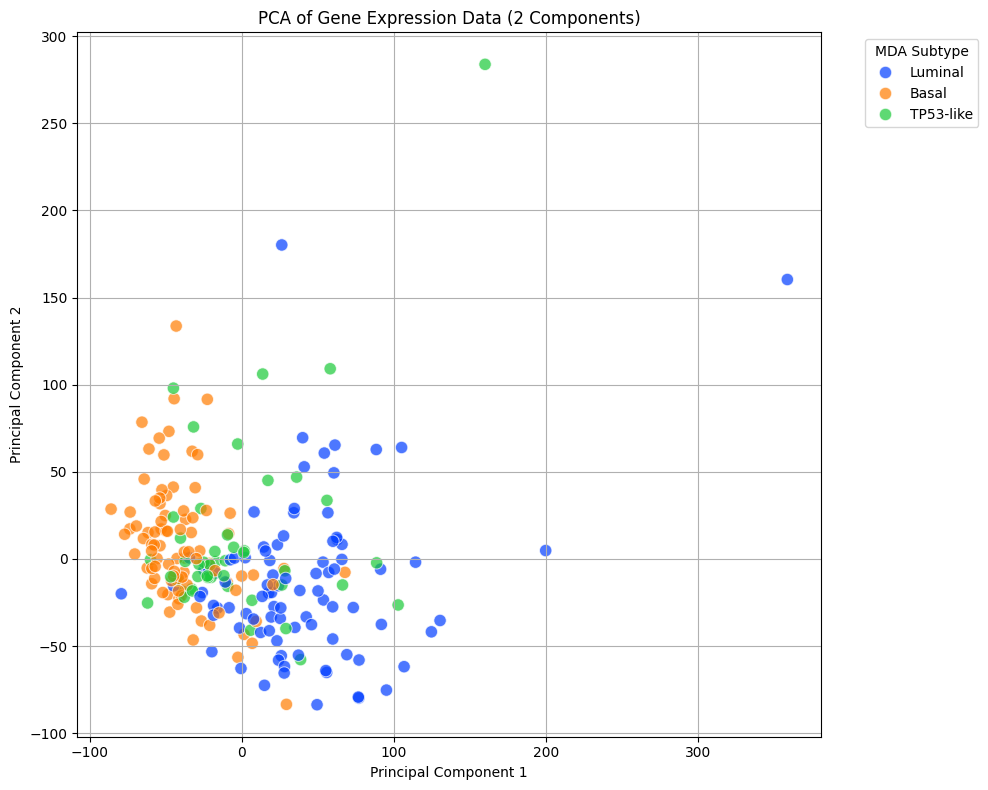

In [ ]:
#5   PCA
wide_data = 'C:/Users/sspat/Desktop/Wide Data.csv'
try:
    #Loading Input File
    df_wide_data = pd.read_csv(wide_data)
    print(f"Successfully loaded '{wide_data}'. Shape: {df_wide_data.shape}")
    #SampleID as Index 
    if 'SampleID' in df_wide_data.columns:
        df_wide_data.set_index('SampleID', inplace=True)
        print("Set 'SampleID' as DataFrame index.")

    #Variables Allocation
    # X will be all gene expression columns
    # y will be the 'MDA' subtype column
    if 'MDA' not in df_wide_data.columns:
        raise ValueError("Column not found")
    X = df_wide_data.drop(columns=['MDA']) 
    y = df_wide_data['MDA']             
    print(f"\nShape of features (X): {X.shape}")
    print(f"Shape of target (y): {y.shape}")
    print(f"MDA Subtypes unique values: {y.unique()}")

    #Scaling for PCA
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
    print("Scaling complete.")

    #PCA
    pca_1 = 2
    print("PCA in process")
    pca = PCA(n_components=pca_1)
    principal_components = pca.fit_transform(X_scaled)

    #DataFrame for the principal components
    pca_df = pd.DataFrame(data=principal_components,
                          columns=[f'PC{i+1}' for i in range(pca_1)],
                          index=X.index)

    #MDA in the dataframe
    pca_df['MDA_Subtype'] = y
    print(f"Shape of PCA result DataFrame: {pca_df.shape}")
    print("First 5 rows of PCA results with MDA Subtype:")
    print(pca_df.head())

    #Variance Ratio
    explained_variance_ratio = pca.explained_variance_ratio_
    print(f"\nExplained variance ratio by PC1: {explained_variance_ratio[0]:.2f}")
    print(f"Explained variance ratio by PC2: {explained_variance_ratio[1]:.2f}")
    print(f"Total explained variance by {pca_1} PCs: {sum(explained_variance_ratio):.2f}")

    #Visualization
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='PC1', y='PC2', hue='MDA_Subtype', data=pca_df,
                    palette='bright', s=80, alpha=0.7)
    plt.title('PCA of Gene Expression Data (2 Components)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(title='MDA Subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

except FileNotFoundError:
    print("File Not Found")
except ValueError as e:
    print("Data Error")


Performing UMAP with 2 components...


C:\Users\sspat\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\sspat\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Shape of UMAP result DataFrame: (229, 3)
<bound method NDFrame.head of                 UMAP_1    UMAP_2 MDA_Subtype
SampleID                                    
TCGA-BL-A0C8  1.534590 -1.284604     Luminal
TCGA-BL-A13I  0.538973 -0.413181       Basal
TCGA-BL-A13J  0.850126 -1.487578   TP53-like
TCGA-BL-A3JM  2.384396 -0.309591       Basal
TCGA-BL-A5ZZ  0.681655 -0.560111       Basal
...                ...       ...         ...
TCGA-S5-A6DX  3.754019 -3.265566   TP53-like
TCGA-UY-A78K  2.106112 -2.102457     Luminal
TCGA-UY-A78L  1.840744  1.188404       Basal
TCGA-UY-A78N  3.959089 -1.118110     Luminal
TCGA-UY-A78O  3.549624 -2.773333     Luminal

[229 rows x 3 columns]>


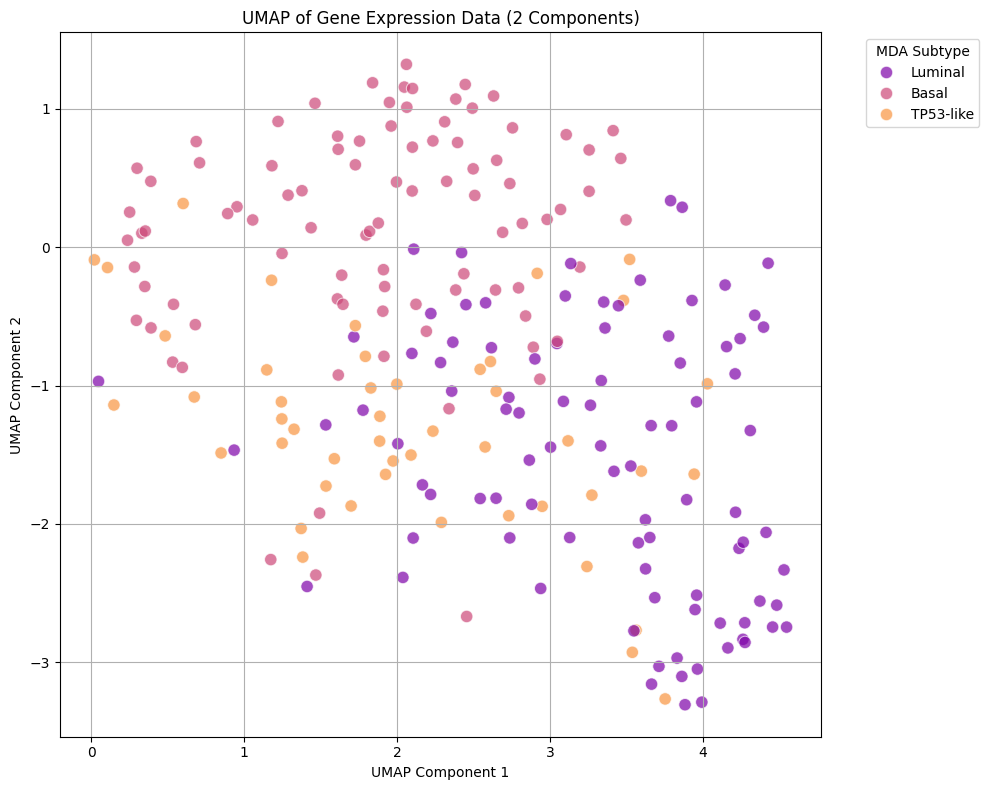

In [ ]:
#6 UMAP- Uniform Manifold Approximation

try:
    #Loading Wide data
    df_wide_data = pd.read_csv(wide_data)
    if 'SampleID' in df_wide_data.columns:
        df_wide_data.set_index('SampleID', inplace=True)
    X = df_wide_data.drop(columns=['MDA'])
    y = df_wide_data['MDA']             

    #Scaling
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index) # Keep as DataFrame for clarity
    n_components_umap = 2
    print(f"\nPerforming UMAP with {n_components_umap} components...")

    #Parameter
    reducer = umap.UMAP(n_components=n_components_umap,min_dist=0.1, random_state=42)
    umap_embedding = reducer.fit_transform(X_scaled)
    umap_df = pd.DataFrame(data=umap_embedding,
                           columns=[f'UMAP_1', f'UMAP_2'],
                           index=X.index)

    #MDA in the DataFrame
    umap_df['MDA_Subtype'] = y
    print(f"Shape of UMAP result DataFrame: {umap_df.shape}")
    print(umap_df.head)

    #Visualization
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='UMAP_1', y='UMAP_2', hue='MDA_Subtype', data=umap_df,
                    palette='plasma', s=80, alpha=0.7)
    plt.title('UMAP of Gene Expression Data (2 Components)')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.legend(title='MDA Subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

except FileNotFoundError:
    print("File not Found")
except ValueError as e:
    print("Data Error")

In [ ]:
#7 Training the Random Forest
#Note the training and testing data would be split in 80:20 ratio where 80% would be training data and 20% testing data

try:
    #Loading Wide Data
    df_wide_data = pd.read_csv(wide_data)
    print("File Read")

    #Scaling
    print("Scaling for Random Forest")
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
    print("Scaling complete.")

    #MDA
    print("Converting MDA subtypes to numerical labels for the classifier")
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)
    subtype_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
    print(f"Original Subtypes to Encoded Labels: {subtype_mapping}")
    print(f"Encoded target labels (y_encoded) shape: {y_encoded.shape}")
    
    #Splitting Data into Training And Testing Sets
    print("\nSplitting data into training and testing sets (80% train, 20% test)")
    X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)
    print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")
    print(f"y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")

    #Initialize
    print("\nTraining Classifier")
    rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    rf_classifier.fit(X_train, y_train)
    print("Classifier Trained")

    #Predictions
    print("\nPrediction")
    y_pred = rf_classifier.predict(X_test)
    print("Predictions made.")
    print("\nModel Evaluation")
    
    # Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Accuracy: {accuracy:.4f}")

    # Classification Report
    target_names = label_encoder.inverse_transform(np.arange(len(label_encoder.classes_)))
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=target_names))

except FileNotFoundError:
    print("File not Found")
except ValueError as e:
    print("Data Error")

File Read
Scaling for Random Forest
Scaling complete.
Converting MDA subtypes to numerical labels for the classifier
Original Subtypes to Encoded Labels: {'Basal': np.int64(0), 'Luminal': np.int64(1), 'TP53-like': np.int64(2)}
Encoded target labels (y_encoded) shape: (229,)

Splitting data into training and testing sets (80% train, 20% test)
X_train shape: (183, 59427), X_test shape: (46, 59427)
y_train shape: (183,), y_test shape: (46,)

Training Classifier
Classifier Trained

Prediction
Predictions made.

Model Evaluation
Accuracy: 0.8696

Classification Report:
              precision    recall  f1-score   support

       Basal       0.89      0.89      0.89        18
     Luminal       0.90      0.95      0.92        19
   TP53-like       0.75      0.67      0.71         9

    accuracy                           0.87        46
   macro avg       0.85      0.83      0.84        46
weighted avg       0.87      0.87      0.87        46



Data loaded and Random Forest model re-trained for SHAP analysis.

Performing SHAP Analysis
Calculating SHAP values for the test set
SHAP values calculation complete.

Generating SHAP Summary Bar Plot


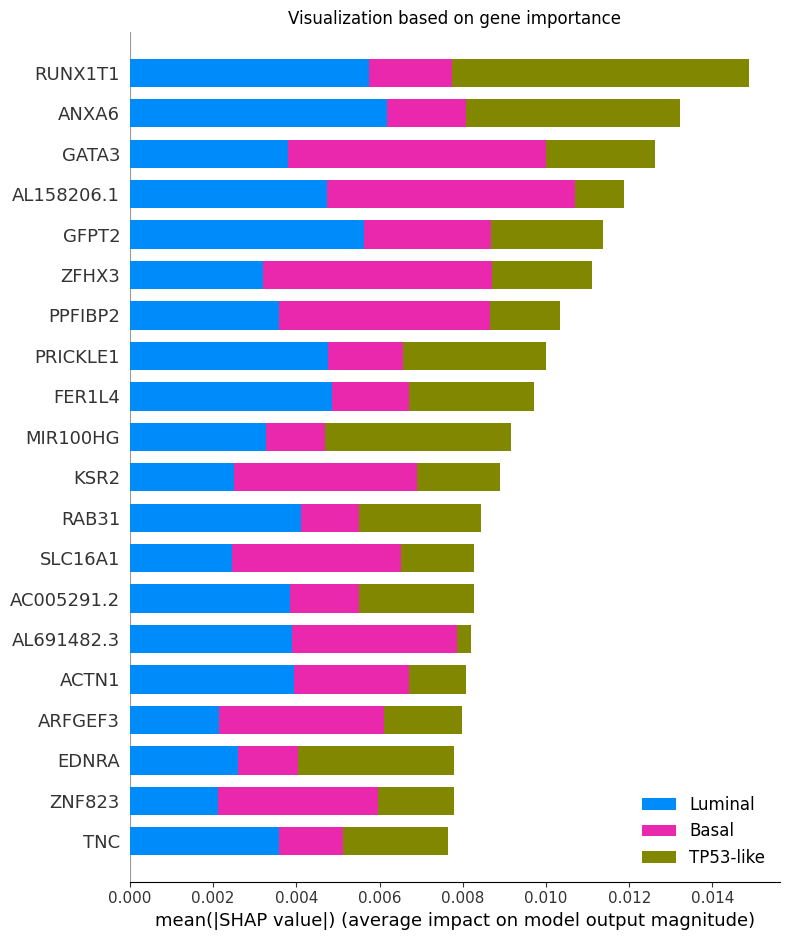

In [ ]:
#8  Visualizing Gene Importance using SHAP
try:
    #Loading Data
    df_wide_data = pd.read_csv(wide_data)

    #Mapping Storing Variable 
    subtype_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
    X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)
    rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    rf_classifier.fit(X_train, y_train)
    print("Data loaded and Random Forest model re-trained for SHAP analysis.")

    #SHAP Analysis
    print("\nPerforming SHAP Analysis")
    
    #Using TreeExplainer especially for Random Forest
    explainer = shap.TreeExplainer(rf_classifier)
    print("Calculating SHAP values for the test set")
    shap_values = explainer.shap_values(X_test)
    print("SHAP values calculation complete.")
    feature_names = X.columns.tolist()

    #Original class names for plotting
    class_names = label_encoder.inverse_transform(np.arange(len(label_encoder.classes_)))
    
    #Visualization
    print("\nGenerating SHAP Summary Bar Plot")
    plt.figure(figsize=(10, 8))
    shap.summary_plot(shap_values, X_test, feature_names=feature_names,
                      plot_type="bar", class_names=class_names, show=False)
    plt.title('Visualization based on gene importance')
    plt.tight_layout()
    plt.show()

except FileNotFoundError:
    print("File not Found.")

In [67]:
#Streamlit

In [68]:
#Preprocessing For Streamlit

In [ ]:
#9 Streamlit Resources
try:
    df_wide_data = pd.read_csv(wide_data)
    if 'SampleID' in df_wide_data.columns:
        df_wide_data.set_index('SampleID', inplace=True)
    X = df_wide_data.drop(columns=['MDA'])
    y = df_wide_data['MDA']
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)
    X_train, X_test, y_train, y_test = train_test_split(
        X_scaled_df, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
    )
    rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    rf_classifier.fit(X_train, y_train)
    #Saving in a dedicated Directory
    models_dir = 'C:/Users/sspat/Desktop/trained_models'
    os.makedirs(models_dir, exist_ok=True) # Create the directory if it doesn't exist
    model_path = os.path.join(models_dir, 'random_forest_model.joblib')
    scaler_path = os.path.join(models_dir, 'scaler.joblib')
    encoder_path = os.path.join(models_dir, 'label_encoder.joblib')
    gene_names_path = os.path.join(models_dir, 'gene_names.joblib')
    joblib.dump(rf_classifier, model_path)
    joblib.dump(scaler, scaler_path)
    joblib.dump(label_encoder, encoder_path)
    joblib.dump(X.columns.tolist(), gene_names_path) # Save the ordered list of all gene names
    print(f"\nModel saved to: {model_path}")
    print(f"Scaler saved to: {scaler_path}")
    print(f"Label Encoder saved to: {encoder_path}")
    print(f"All gene names saved to: {gene_names_path}")
    print("\nAll necessary components have been saved successfully.")

except Exception as e:
    print(f"An error occurred during saving components: {e}")


Model saved to: C:/Users/sspat/Desktop/trained_models\random_forest_model.joblib
Scaler saved to: C:/Users/sspat/Desktop/trained_models\scaler.joblib
Label Encoder saved to: C:/Users/sspat/Desktop/trained_models\label_encoder.joblib
All gene names saved to: C:/Users/sspat/Desktop/trained_models\gene_names.joblib

All necessary components have been saved successfully.


In [ ]:
#10 UI
st.set_page_config(page_title="Bladder Cancer Subtypes Model", layout = "wide")
st.title("Cancer Subtype Classification from Gene Expression Data")
st.markdown("Upload a CSV file which fulfills the Requisites mentioned below")

#Loading The Trained models and preprocessors
@st.cache_resource
def load_model_components():
    models_dir = 'C:/Users/sspat/Desktop/trained_models'
    try:
        model = joblib.load(os.path.join(models_dir, 'random_forest_model.joblib'))
        scaler = joblib.load(os.path.join(models_dir, 'scaler.joblib'))
        label_encoder = joblib.load(os.path.join(models_dir, 'label_encoder.joblib'))
        gene_names = joblib.load(os.path.join(models_dir, 'gene_names.joblib'))
        return model, scaler, label_encoder, gene_names
    except FileNotFoundError as e:
        st.error("The trained_models error")
        st.stop()
    except Exception as e:
        st.error("Model Components error")
        st.stop()
model, scaler, label_encoder, training_gene_names = load_model_components()
st.info(""" **Requisites:**
        
        1. Make sure that the Gene Expression Profile must be in CSV format.
        2. The File should be arranged with appropriate samples and their respective IDs.
        3. The Rows must be individual Samples and Columns should be genes, if not then the model will do so automatically.""")
#Uploader
upload_file = st.file_uploader("Upload the desired CSV file", type = "csv")
if upload_file is not None:
    try:
        df = pd.read_csv(upload_file)
        st.write("Preview")
        st.dataframe(df.head(5))
        data_pro = pd.DataFrame(0.0, index=df.index, columns= training_gene_names)
        sample_list  = []
        for index, row in df.iterrows():
            sample_data = pd.Series(0.0, index = training_gene_names)
            for gene in training_gene_names:
                if gene in row.index: # Check if the gene exists in the uploaded row
                    sample_data[gene] = row[gene]
                    sample_list.append(sample_data) 
        pro_data = pd.DataFrame(sample_list, index = df.index, columns = training_gene_names)

        #Scaling
        st.write("Scaling the Data")
        s_inp = scaler.transform(pro_data)
        s_df = pd.DataFrame(s_inp, columns = training_gene_names, index = df.index)
        st.write("Scaling Complete.")

        #Make Predictions
        st.write("Predicting")
        prediction = model.predict(s_inp)
        prediction_labels = label_encoder.inverse_transform(prediction)
        predicted_df = pd.DataFrame(
            {
                'SampleID' : df.index,
                'Predicted_Subtype': prediction_labels
            }
        )
        predicted_df.set_index('SampleID', inplace=True)
        st.write("Results:")
        st.dataframe(predicted_df)

    except pd.errors.EmptyDataError:
        st.error("CSV file empty")

2025-06-16 04:52:27.488 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-16 04:52:27.489 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-16 04:52:27.869 
  command:

    streamlit run C:\Users\sspat\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\ipykernel_launcher.py [ARGUMENTS]
2025-06-16 04:52:27.870 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-16 04:52:27.870 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-16 04:52:27.871 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-16 0

In [75]:
#The above code has been saved in a dedicated file named "App.py" and then using terminal and the followind code it is run in a seperate browser:
# Terminal Code:        cd Desktop  //Changes the path to dektop
#                       python -m streamlit run App.py --server.maxUploadSize=4500 //To upload a 4.5 GB file 